imports

In [2]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch

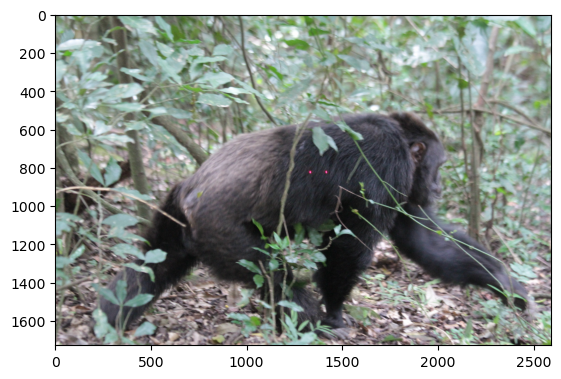

In [20]:
img = cv2.imread('red_laser.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

Helper functions for displaying points, boxes, and masks

In [4]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))

In [5]:
from segment_anything import sam_model_registry, SamPredictor

sam_checkpoint = "../sam_vit_h_4b8939.pth"
model_type = "vit_h"

# device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
# sam.to(device=device)

predictor = SamPredictor(sam)

In [6]:
predictor.set_image(img)

[W NNPACK.cpp:53] Could not initialize NNPACK! Reason: Unsupported hardware.


In [7]:
input_point = np.array([[1600, 800]])
input_label = np.array([1])

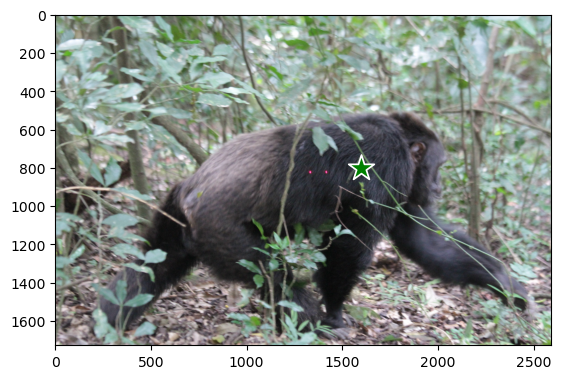

In [8]:
plt.imshow(img)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()

In [9]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

In [10]:
masks.shape  # (number_of_masks) x H x W

(3, 1728, 2592)

In [11]:
print(scores)
max_idx = np.argmax(scores)
max_idx

[0.56502724 0.9930191  0.9578682 ]


1

In [12]:
masks[max_idx].shape

(1728, 2592)

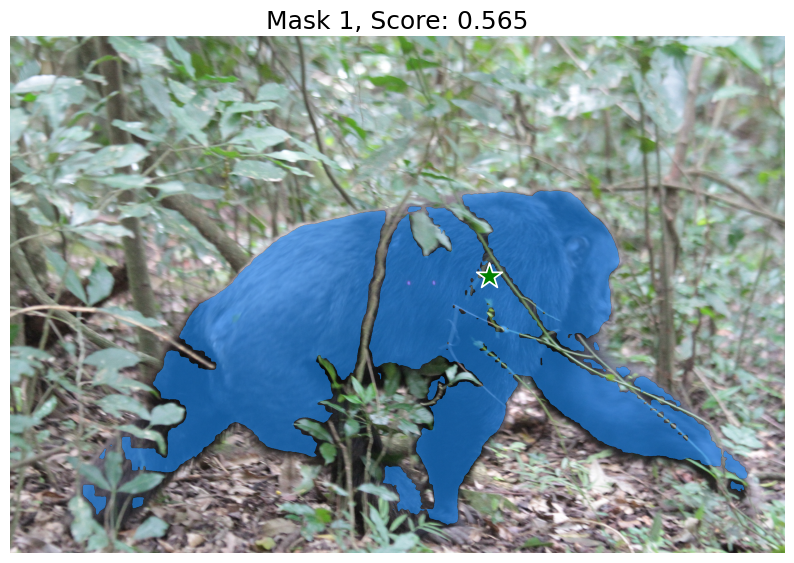

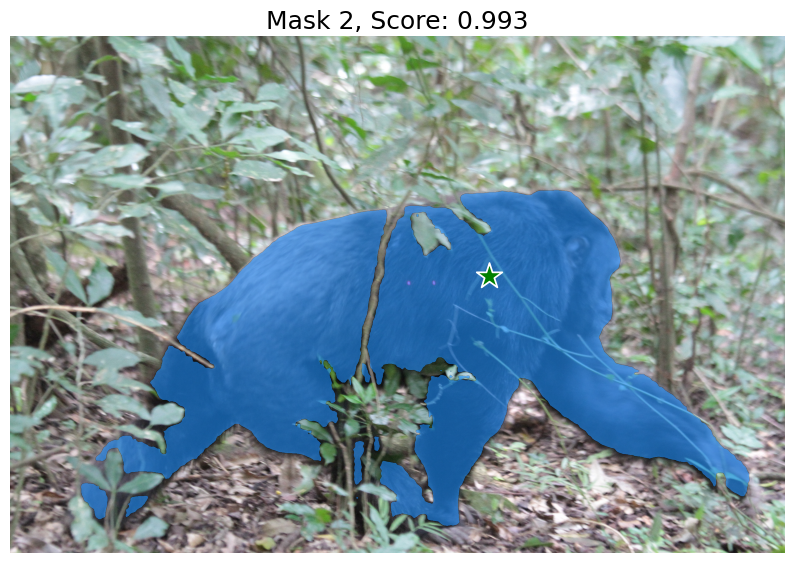

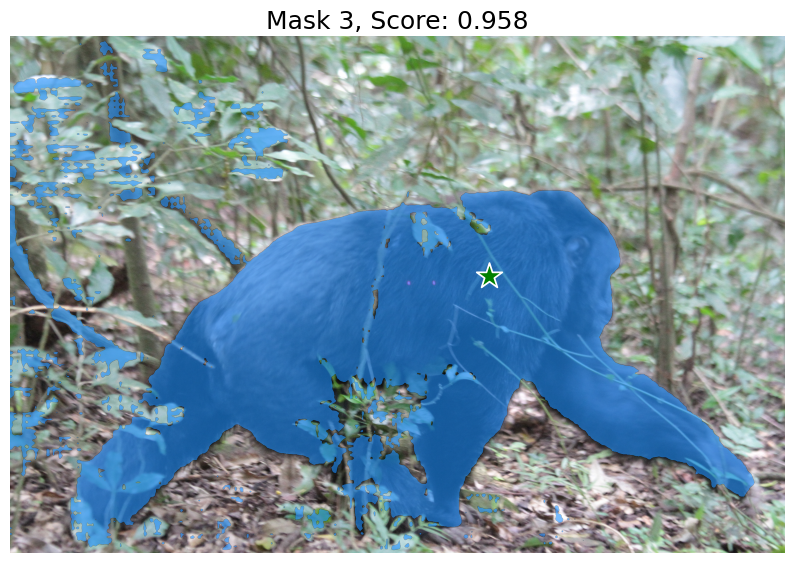

In [13]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

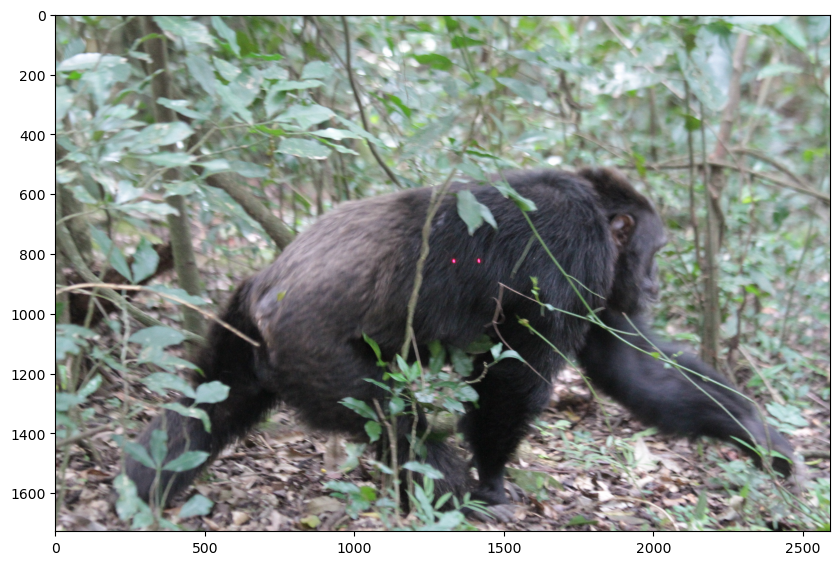

In [17]:
# get best mask
best_mask = masks[max_idx]
output = np.zeros_like(img)
output[best_mask] = img[best_mask]

# show result
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.show()

In [22]:
from skimage.feature import blob_log

#img2 = output

# Assuming 'img' is your input image
hsv_frame = cv2.cvtColor(img, cv2.COLOR_BGR2HSV) #convert from BGR to HSV

# Define two ranges for red (due to the circular nature of the hue scale in HSV)
low_red1 = np.array([0, 120, 70])
high_red1 = np.array([10, 255, 255])
low_red2 = np.array([170, 120, 70])
high_red2 = np.array([180, 255, 255])

# Create masks for the red ranges
red_mask1 = cv2.inRange(hsv_frame, low_red1, high_red1)
red_mask2 = cv2.inRange(hsv_frame, low_red2, high_red2)
red_mask = cv2.bitwise_or(red_mask1, red_mask2)

# Apply mask to the image
red = cv2.bitwise_and(img, img, mask=red_mask)

# Extract red channel for processing (assuming red dots are the brightest in the red channel)
r = red[:,:,2]

# Apply Gaussian blur for smoothing
blur = cv2.GaussianBlur(r, (25, 25), 0)

# Apply thresholding
ret3, thresh = cv2.threshold(blur, 210, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Dilation to enlarge dots (tune parameters as needed)
thresh = cv2.dilate(thresh, (5, 5), iterations=28)

# Blob detection
blobs = blob_log(thresh, max_sigma=50, threshold=0.15)
count =0
if blobs.size != 0:  #checks if a blob was found
# ax[1].imshow(thresh, cmap='gray')
    for blob in blobs[:2,:]:
        y, x, area = blob
        if area>1:   #checks for area of blob
            count +=1

            result1 = cv2.circle(img, (int(x),int(y)),12,(0,0,255),-1) # draws circles on detected blob
            plt.imshow(result1)
            plt.show()
else:
    print("No points found :(")

No points found :(


In [23]:
import new_laser_test as nlt
import laser_detection as ld
import importlib
importlib.reload(nlt)
importlib.reload(ld)
# result, points = nlt.find_lasers(img)
result, points = ld.detect_laser_points(output, img)

In [24]:
points

[(1647, 849), (1602, 857), (1660, 870), (1649, 884)]

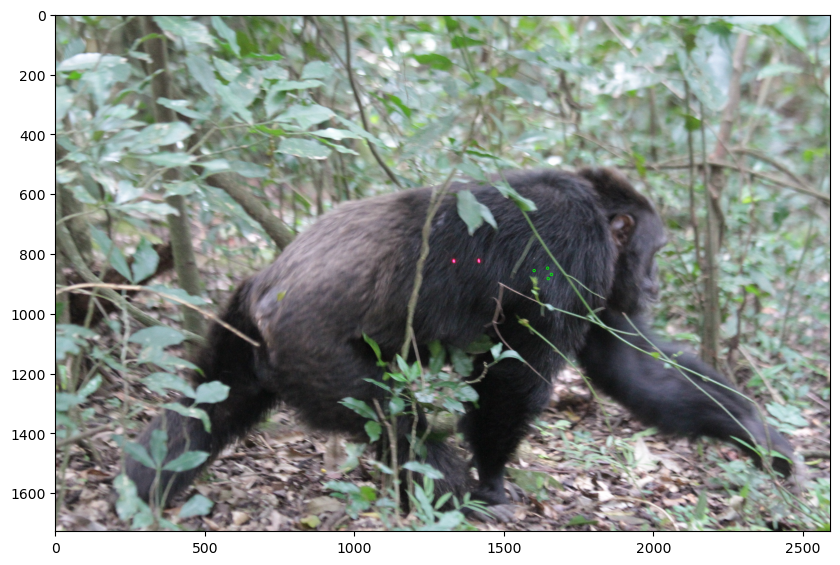

In [25]:
plt.figure(figsize=(10,10))
plt.imshow(result)

Use segmented image to run laser detection algorithm

In [14]:
from skimage.feature import blob_log

In [15]:
hsv_frame = cv2.cvtColor(output, cv2.COLOR_BGR2HSV) #convert from BGR to HSV 

low_green = np.array([55, 110, 110])  #low_green values for green mask
high_green = np.array([65, 255, 255]) #high_green values for green mask
green_mask = cv2.inRange(hsv_frame, low_green, high_green) #performs basic threshold
green = cv2.bitwise_and(output, output, mask=green_mask)#performs bitwise and operation

g = green[:,:,1] #extracts the green channel
blur = cv2.GaussianBlur(g,(25,25),0) #adds blurring for smoothing
ret3,thresh = cv2.threshold(blur,210,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU) #thresholding technique - pixel values <210 turn to 0, pixel values >210 turn to 255


thresh = cv2.dilate(thresh,(5,5),iterations=28) #adds dilation to enlarge dots a bit can be tuned with the arguments



blobs = blob_log(thresh, max_sigma=50, threshold=0.15) # blob detection
count =0
if blobs.size != 0:  #checks if a blob was found
    for blob in blobs[:2,:]:
        y, x, area = blob
        if area>1:   #checks for area of blob
            count +=1
            result1 = cv2.circle(img.copy(), (int(x),int(y)),24,(0,0,255),-1) # draws circles on detected blob

In [16]:
print(count)

2


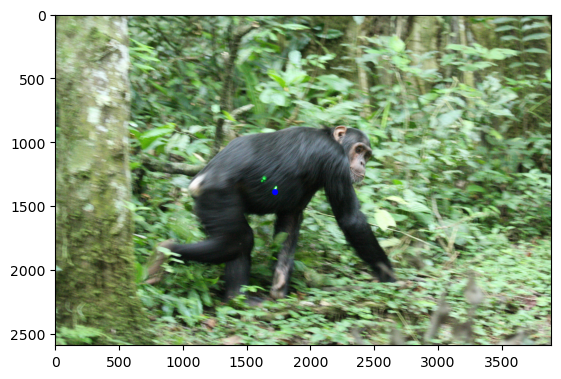

In [17]:
plt.imshow(result1)
plt.show()

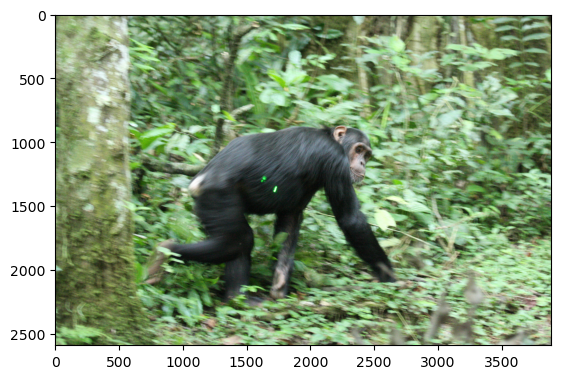

In [18]:
plt.imshow(img)
plt.show()

Let's test segmenting with box approach

In [19]:
print(img.shape)

(2592, 3888, 3)


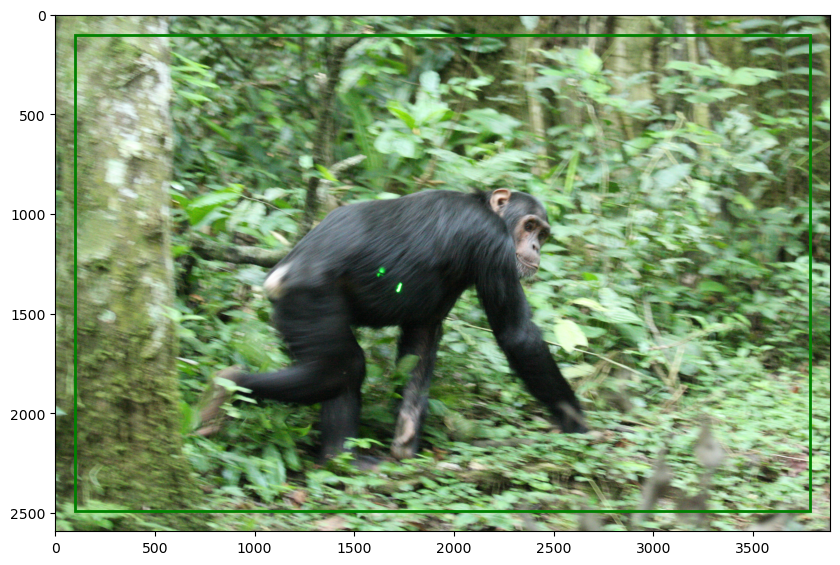

In [20]:
input_box = np.array([100, 100, 3788, 2492])
plt.figure(figsize=(10,10))
plt.imshow(img)
show_box(input_box, plt.gca())
plt.axis('on')
plt.show()

In [21]:
masks, scores, logits = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=True,
)

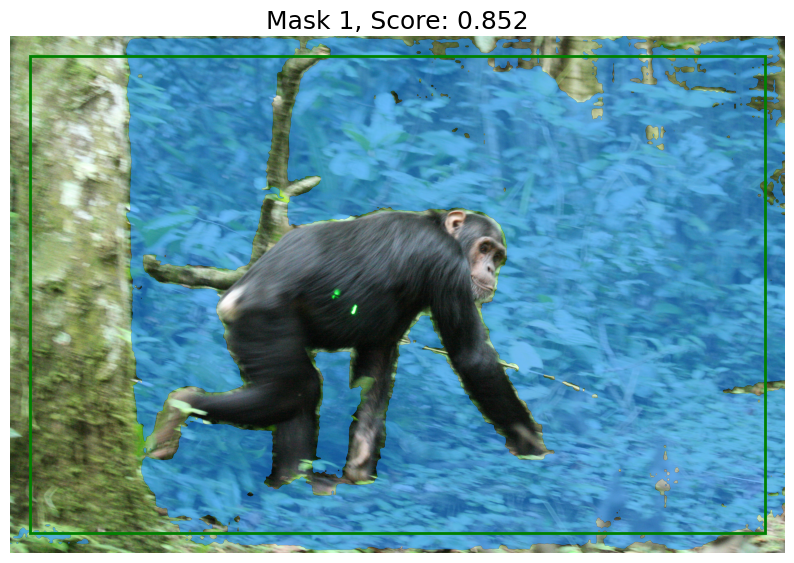

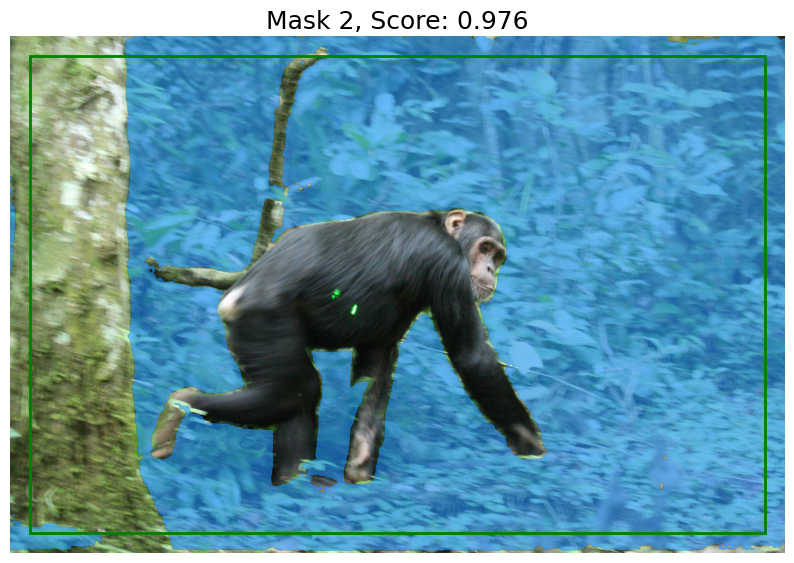

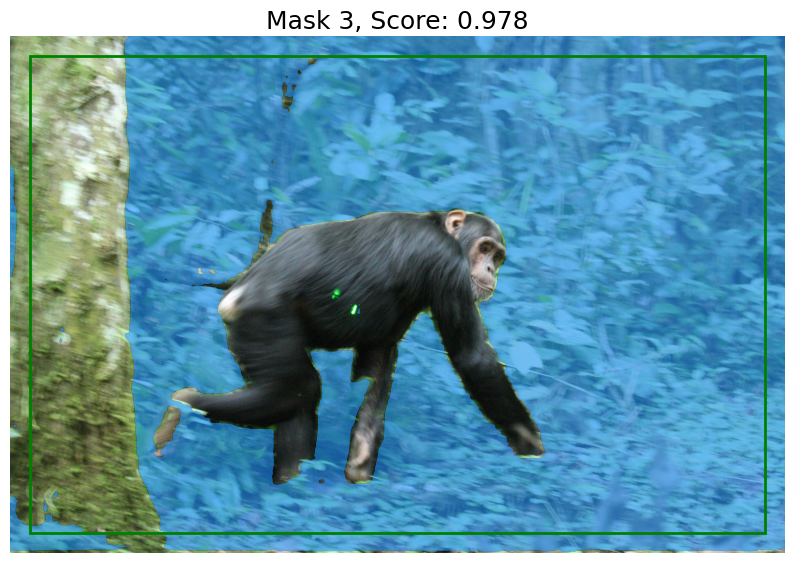

In [22]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    show_mask(masks[i], plt.gca())
    show_box(input_box, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

### Test pipeline from json data. At this point SAM has already been run now we just need to detect the laser pointers

In [32]:
import json
import os

image_folder = 'sample_data'
masks_folder = 'sample_data_masks'
json_file = 'im_coords_masks.json'

# Load the JSON data
with open(json_file, 'r') as file:
    im_data = json.load(file)

im1_data = im_data['IMG_0615.JPG']

# load source
source_path = os.path.join(image_folder, 'IMG_0615.JPG')
source = cv2.imread(source_path)
source = cv2.cvtColor(source, cv2.COLOR_BGR2RGB)

# load mask
mask_path = os.path.join(masks_folder, im1_data['mask'])
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
mask = mask > 0  # need to convert to boolean values

# Apply the mask
masked_im = np.zeros_like(source)
masked_im[mask] = source[mask]

In [37]:
import laser_detection as ld
import new_laser_test as nlt
# avoids caching issue if changes made to imported file
import importlib
importlib.reload(ld)
importlib.reload(nlt)

<module 'new_laser_test' from '/Users/jbrandinger/Documents/DS Capstone/fuzzy-wuzzy/new_laser_test.py'>

In [40]:
result, points = nlt.find_lasers(masked_im)

Laser point at: (1361, 2259)
Laser point at: (1369, 2236)
Laser point at: (1351, 2237)
Laser point at: (1352, 2232)
Laser point at: (1365, 2229)
Laser point at: (1373, 2224)
Laser point at: (1370, 2220)
Laser point at: (1360, 2222)
Laser point at: (1376, 2217)
Laser point at: (1361, 2214)
Laser point at: (1363, 2200)
Laser point at: (1378, 2202)
Laser point at: (1368, 2189)
Laser point at: (1385, 2190)
Laser point at: (1379, 2181)
Laser point at: (1385, 2172)
Laser point at: (1401, 2155)
Laser point at: (1392, 2159)
Laser point at: (1391, 2140)
Laser point at: (1399, 2142)
Laser point at: (1395, 2145)
Laser point at: (1402, 2128)
Laser point at: (1407, 2118)
Laser point at: (1414, 2105)
Laser point at: (1411, 2098)
Laser point at: (1414, 2090)
Laser point at: (1423, 2086)
Laser point at: (1587, 1997)
Laser point at: (1601, 1976)
Laser point at: (1358, 1820)
Laser point at: (1491, 1815)
Laser point at: (1498, 1803)
Laser point at: (1651, 1771)
Laser point at: (1316, 1766)
Laser point at

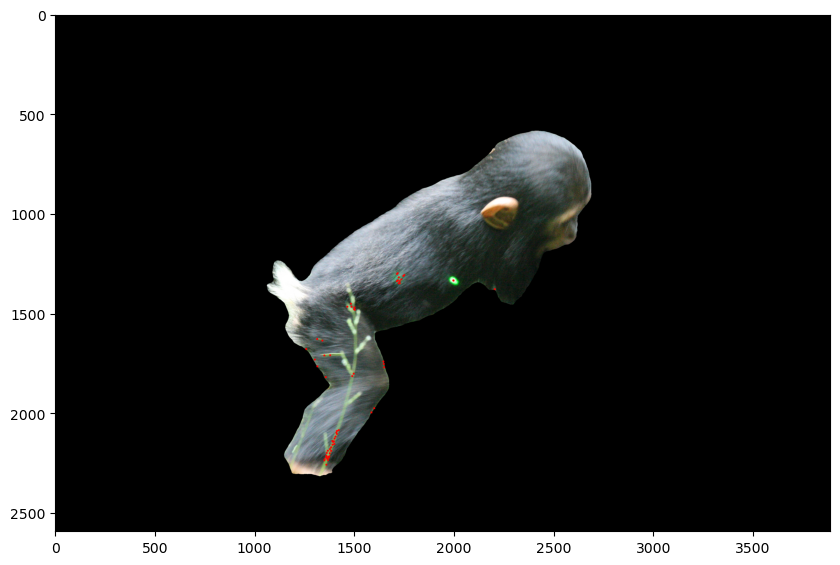

In [41]:
plt.figure(figsize=(10,10))
plt.imshow(result)

In [31]:
points[0]

(2001, 1351)